In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np


In [2]:
df=pd.read_csv("Resources_k/df_all_k.csv",index_col=False)
df

,Unnamed: 0,fire_id,fire_size,fire_cause,latitude,longitude,state,state_no,discovery_month,discovery_month_no,...,Temp_pre_7,Wind_pre_30,Wind_pre_15,Wind_pre_7,Hum_pre_30,Hum_pre_15,Hum_pre_7,fire_size_bin,fire_size_bin_no,medium_plus
0,0,3,1.00,Debris Burning,39.641400,-119.308300,NV,29,Jun,6,...,18.142564,4.054982,3.398329,3.671282,44.778429,37.140811,35.353846,Teacup,1,0
1,1,24,40.00,Arson,31.435181,-88.999489,MS,22,Apr,4,...,15.604790,2.038268,1.737921,1.775904,57.997207,56.747191,59.614458,Mini,3,0
2,2,31,1.20,Debris Burning,48.833000,-99.783600,ND,25,Apr,4,...,-4.273834,5.800667,6.012852,6.658621,77.575012,75.963981,71.173116,Teacup,1,0
3,3,35,30.18,Debris Burning,31.259000,-84.895600,GA,8,Oct,10,...,18.188679,3.659840,3.366443,2.211429,67.551783,61.733788,60.328571,Mini,3,0
4,4,36,1420.00,Lightning,33.241800,-104.912200,NM,28,Jul,7,...,34.893333,4.026367,3.844922,3.695833,28.783203,25.789062,18.208333,Large,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13133,13133,55336,3409.00,Utilities,31.059000,-98.956367,TX,39,Aug,8,...,28.719917,3.136761,3.238803,3.224274,50.089157,49.416505,55.426471,Large,5,1
13134,13134,55337,4582.00,Utilities,30.075167,-97.149167,TX,39,Oct,10,...,24.221869,1.529850,1.576828,1.563817,62.848172,60.641975,63.196819,Large,5,1
13135,13135,55341,17823.00,Accidental,44.834600,-117.220600,OR,33,Sep,9,...,10.734328,2.608150,2.486802,1.835821,55.009259,62.368700,67.266304,XL,6,1
13136,13136,55342,5086.00,Debris Burning,45.656100,-109.114200,MT,23,Mar,3,...,7.678571,4.428757,4.197593,3.803571,51.676681,46.933399,42.638384,Large,5,1


In [3]:
# get correlations
df_corr = df.corr()

np.ones_like(df_corr, dtype=np.bool)



C:\Users\KATLIN\AppData\Local\Temp/ipykernel_7600/2362995608.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.ones_like(df_corr, dtype=np.bool)


array([[ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True],
       [ T

In [4]:
mask = np.triu(np.ones_like(df_corr, dtype=bool))

C:\Users\KATLIN\AppData\Local\Temp/ipykernel_7600/3559147834.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(df_corr, dtype=np.bool))


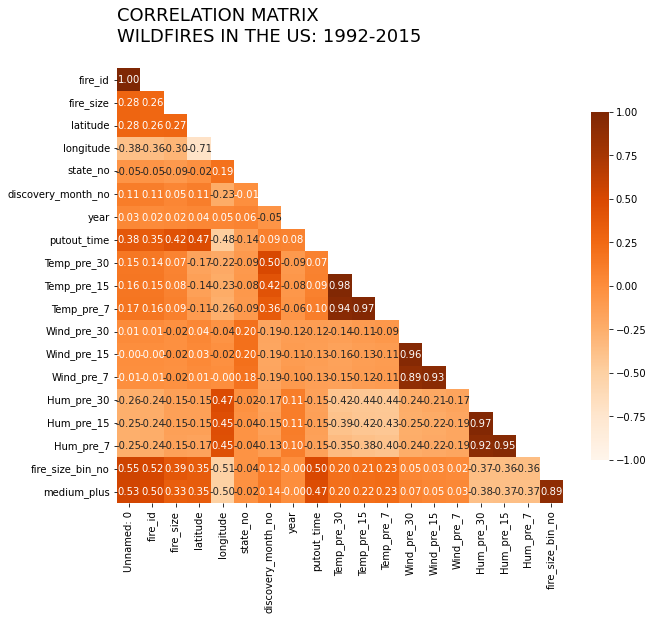

In [5]:


fig, ax = plt.subplots(figsize=(10, 8))
# mask
mask = np.triu(np.ones_like(df_corr, dtype=np.bool))
# adjust mask and df
mask = mask[1:, :-1]
corr = df_corr.iloc[1:,:-1].copy()
# plot heatmap
sb.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='Oranges',
           vmin=-1, vmax=1, cbar_kws={"shrink": .8})
# yticks
plt.yticks(rotation=0)

title = 'CORRELATION MATRIX\nWILDFIRES IN THE US: 1992-2015\n'
plt.title(title, loc='left', fontsize=18)
plt.show()


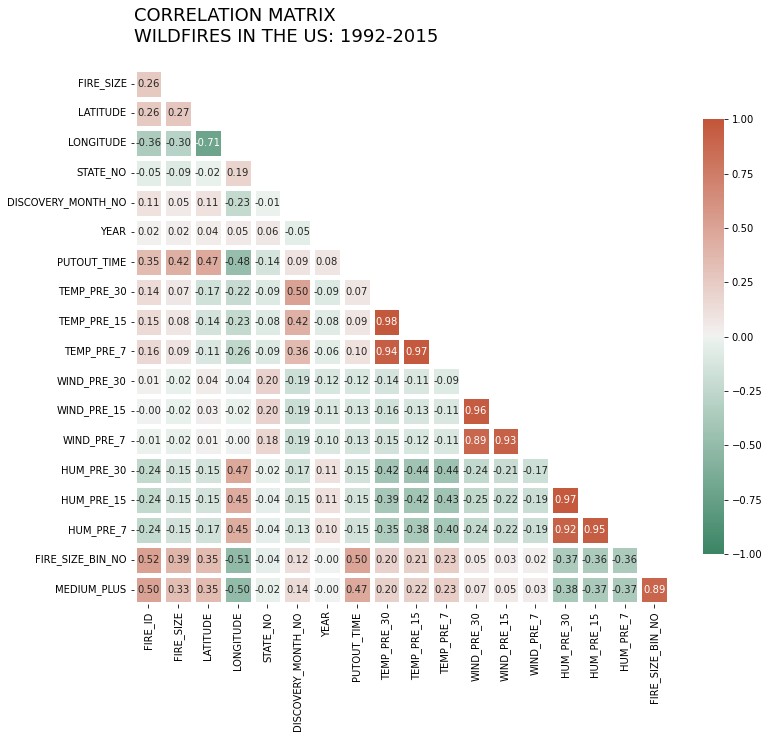

In [29]:
fig, ax = plt.subplots(figsize=(12, 10))
# mask
mask = np.triu(np.ones_like(df_corr, dtype=bool))
# adjust mask and df
mask = mask[1:, :-1]
corr = df_corr.iloc[1:,:-1].copy()
# color map
cmap = sb.diverging_palette(150, 20, as_cmap=True)
# plot heatmap
sb.heatmap(corr, mask=mask, annot=True, fmt=".2f", 
           linewidths=5, cmap=cmap, vmin=-1, vmax=1, 
           cbar_kws={"shrink": .8}, square=True)
# ticks
yticks = [i.upper() for i in corr.index]
xticks = [i.upper() for i in corr.columns]
plt.yticks(plt.yticks()[0], labels=yticks, rotation=0)
plt.xticks(plt.xticks()[0], labels=xticks)
# title
title = 'CORRELATION MATRIX\nWILDFIRES IN THE US: 1992-2015\n'
plt.title(title, loc='left', fontsize=18)
plt.show()

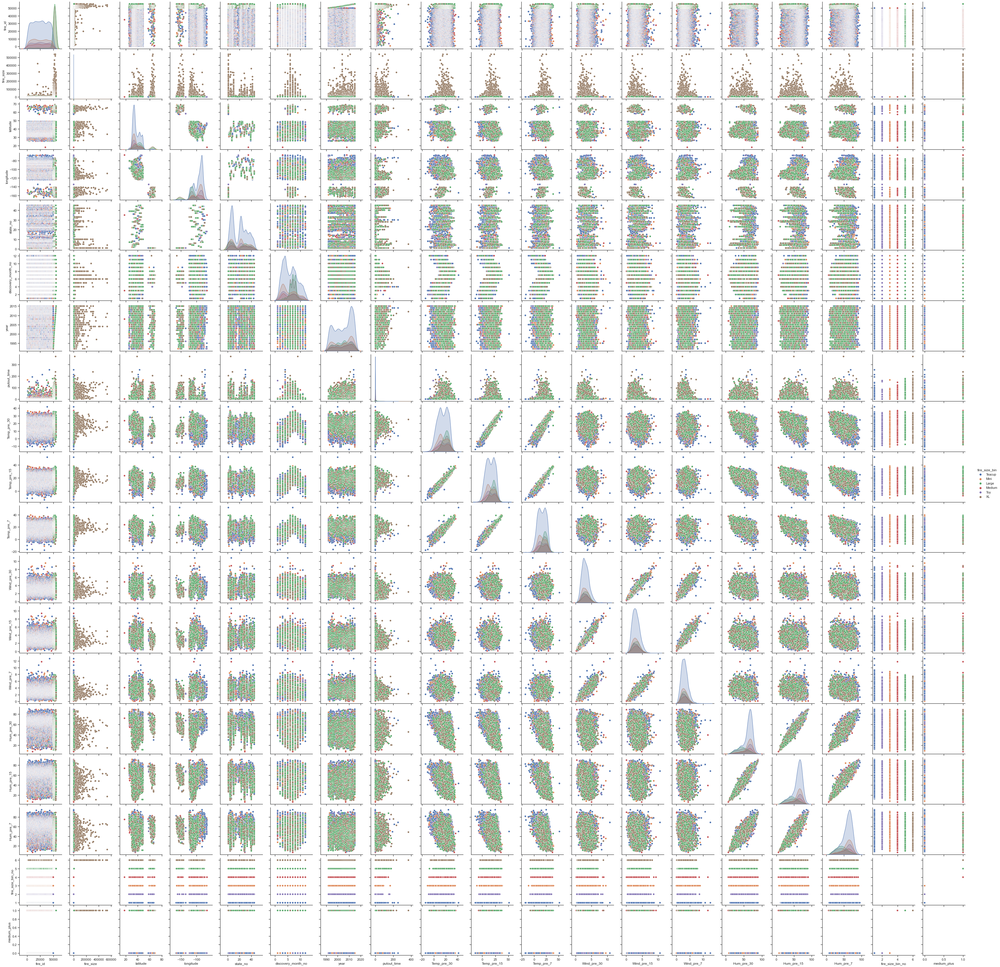

In [31]:
import seaborn as sns
sns.set_theme(style="ticks")

#sns.pairplot(df, hue="fire_size_bin")